# Ground Truth
2277029 정윤서 / 277037 홍지영

In [1]:
import os
import numpy as np
import random
import matplotlib.pyplot as plt
import scipy.io as sio

from PIL import Image
from skimage.util import img_as_float
from skimage.color import rgb2gray
from skimage.io import imread, imsave
from scipy.io import loadmat
from tqdm import tqdm

import cv2
import urllib.request
import matplotlib.pyplot as plt

In [2]:
from google.colab import drive
drive.mount("/content/gdrive")

Mounted at /content/gdrive


In [3]:
data_dir = "/content/gdrive/MyDrive/CV/Group_Project/project_data"

# Checking if our specified directory exists
os.path.exists(data_dir)

True

In [4]:
class BoundaryDataset(object):
    """
    Project boundary dataset wrapper

    Given the path to the root of the dataset, this class provides
    methods for loading images and ground truths.

    Attributes:

    root_dir - the root path of the dataset
    data_path - the path of the data directory within the root
    sample_names - a list of names of images
    """
    def __init__(self, root_dir='.', split='train'):
        """
        Constructor

        :param root_dir: the path to the root of the custom dataset
        :param split: 'train' or 'test'
        """
        self.root_dir = root_dir
        self.data_path = os.path.join(root_dir, split)
        self.sample_names = self._sample_names(self.data_path)

    def __len__(self):
        """
        Get the number of samples in the dataset
        :return: the number of samples
        """
        return len(self.sample_names)

    @staticmethod
    def _sample_names(directory):
        names = []
        files = os.listdir(directory)
        for fn in files:
            name, ext = os.path.splitext(fn)
            if ext.lower() == '.jpg':
                names.append(name)
        return names

    def read_image(self, name):
        """
        Load the image identified by the sample name
        :param name: the sample name
        :return: a (H,W,3) array containing the image
        """
        path = os.path.join(self.data_path, f"{name}.jpg")
        return imread(path)

    def load_boundaries(self, name):
        """
        Load the boundaries identified by the sample name
        :param name: the sample name
        :return: a list of (H,W) arrays, each of which contains a boundary ground truth
        """
        boundary_path = os.path.join(self.data_path, f"{name}.npy")
        if os.path.exists(boundary_path):
            boundaries = np.load(boundary_path, allow_pickle=True)
            return list(boundaries)
        return []


In [13]:
num_images = 10
split = 'train'
#split = 'test'

# Load the dataset using BoundaryDataset class
dataset = BoundaryDataset(data_dir, split=split)

print(f"Data size: {len(dataset)}")

selected_sample_names = random.sample(dataset.sample_names, min(num_images, len(dataset.sample_names)))

Data size: 200


Processing image: train/183055


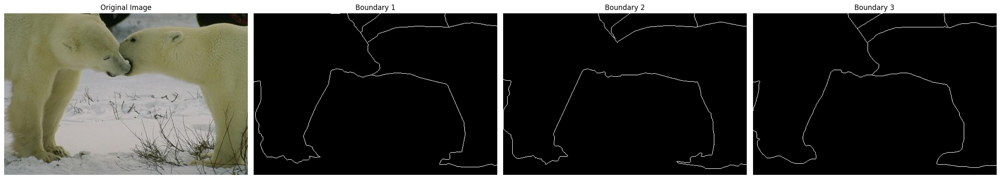

Processing image: train/89072


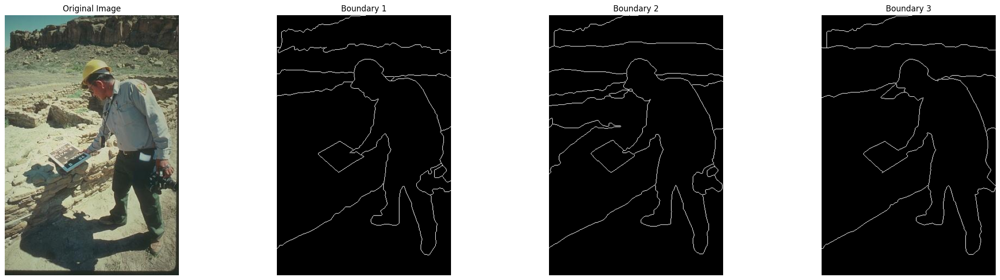

Processing image: train/160068


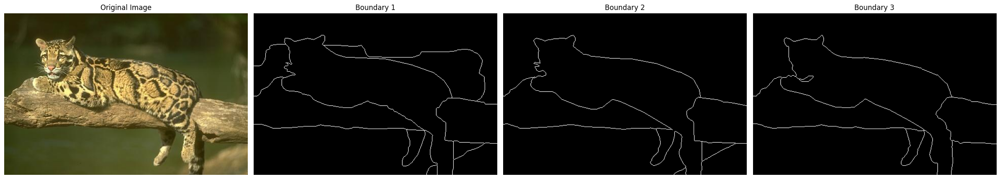

Processing image: train/100080


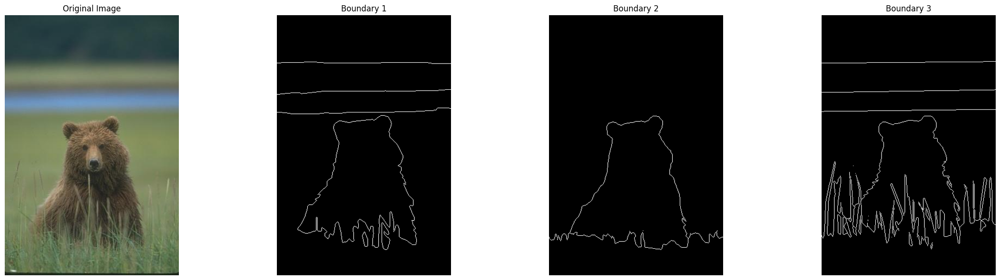

Processing image: train/374020


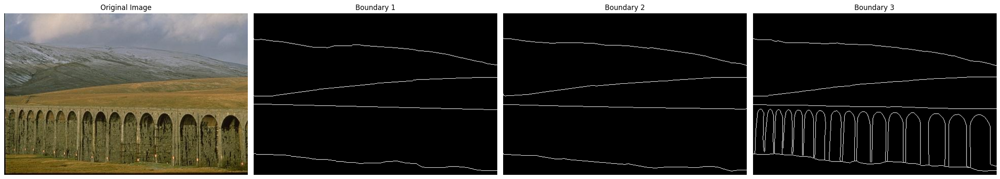

Processing image: train/296059


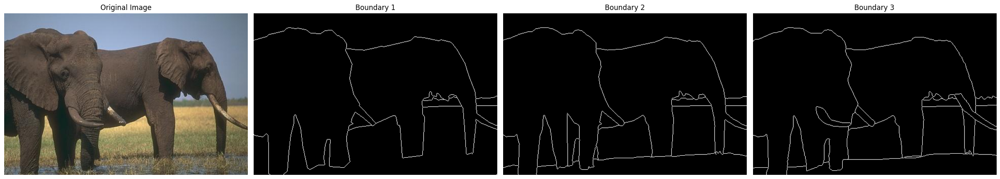

Processing image: train/293029


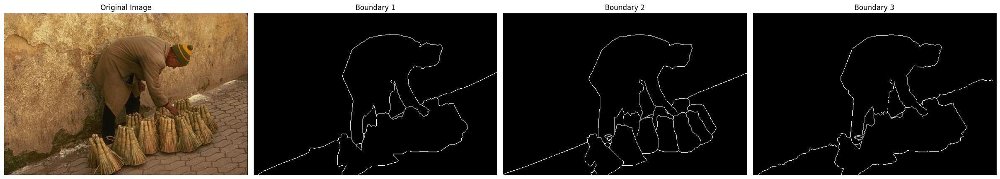

Processing image: train/299091


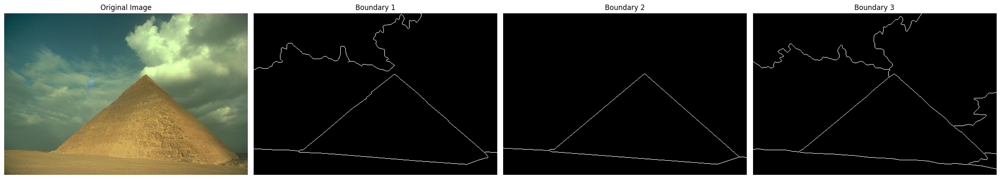

Processing image: train/147021


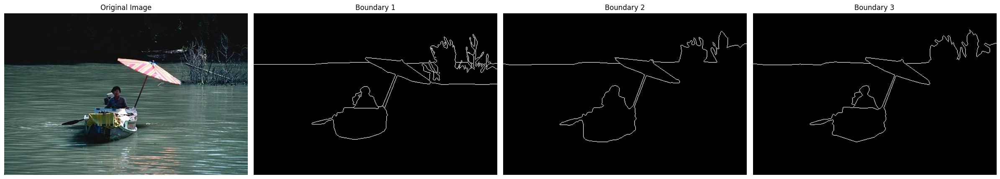

Processing image: train/106020


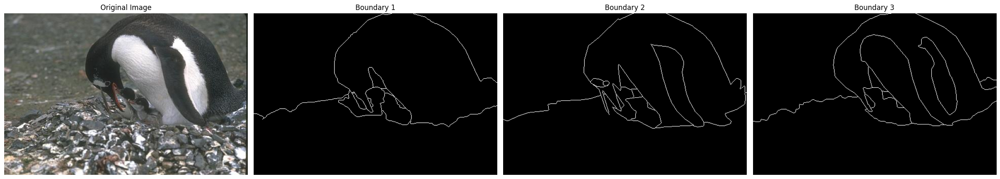

In [19]:
# Plot multiple images and their boundaries
for selected_sample_name in selected_sample_names:
    print(f"Processing image: {split}/{selected_sample_name}")
    image = dataset.read_image(selected_sample_name)
    boundaries = dataset.load_boundaries(selected_sample_name)

    fig, ax = plt.subplots(1, len(boundaries) + 1, figsize=(6 * (len(boundaries) + 1), 6))

    ax[0].imshow(image)
    ax[0].set_title("Original Image")
    ax[0].axis("off")

    for i in range(len(boundaries)):
        ax[i + 1].imshow(boundaries[i], cmap='gray')
        ax[i + 1].set_title(f"Boundary {i + 1}")
        ax[i + 1].axis("off")

    plt.tight_layout()
    plt.show()

# First Try (Report 4.1)

### blend_3.3 Function (Report 3.3)

In [7]:
def blend_33(image, threshold1, threshold2) :
  # Generate two pairs of Gaussian and Median blurred images
  g_image1 = cv2.GaussianBlur(image, (15, 15), 0)
  g_image2 = cv2.GaussianBlur(image, (29, 29), 0)

  m_image1 = cv2.medianBlur(image, 15)
  m_image2 = cv2.medianBlur(image, 29)

  # Apply weighted ensemble to each Gaussian-Median pair
  alpha = 0.3
  blended1 = cv2.addWeighted(g_image1, alpha, m_image1, 1-alpha, 0, dst=None, dtype=None)

  alpha2 = 0.6
  blended2 = cv2.addWeighted(g_image2, alpha2, m_image2, 1-alpha2, 0, dst=None, dtype=None)

  # Apply weighted ensemble to the two weighted ensemble images
  alpha3 = 0.6
  blended3 = cv2.addWeighted(blended1, alpha3, blended2, 1-alpha3, 0, dst=None, dtype=None)
  edges3 = cv2.Canny(blended3, threshold1, threshold2, apertureSize=3)

  return blended3, edges3

### K-means Function

In [8]:
def preprocess_image(image):
    """Reshape the image to a 2D array of pixels and 3 color values (RGB) and convert to float."""
    pixel_values = image.reshape((-1, 3))
    return np.float32(pixel_values)

def perform_kmeans_clustering(pixel_values, k=3):
    """Perform k-means clustering on the pixel values."""
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
    compactness, labels, centers = cv2.kmeans(pixel_values, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
    return compactness, labels, np.uint8(centers)

def create_segmented_image(pixel_values, labels, centers):
    """Create a segmented image using the cluster centroids."""
    segmented_image = centers[labels.flatten()]
    return segmented_image.reshape(image.shape)


### Visualize the First Try Image

Processing image : train/183055


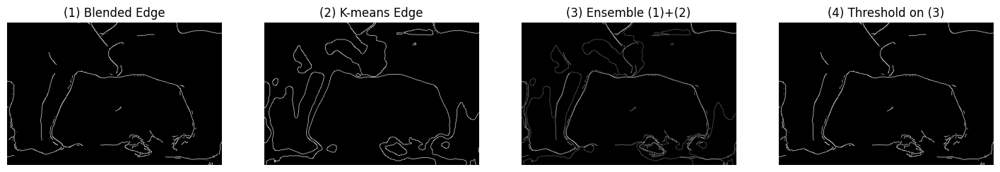

Processing image : train/89072


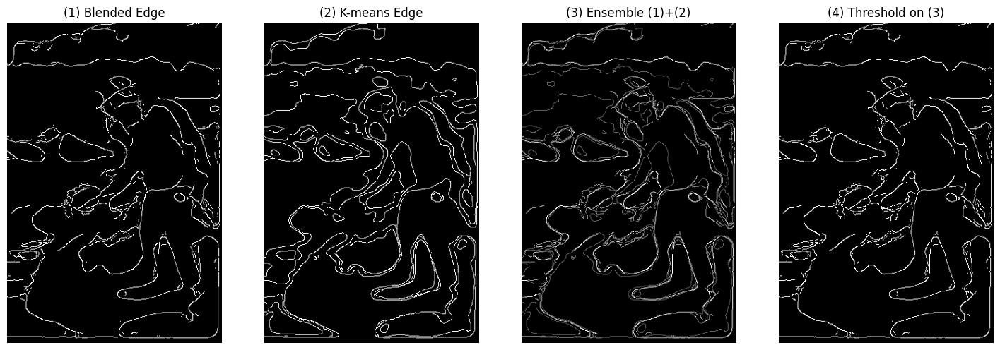

Processing image : train/160068


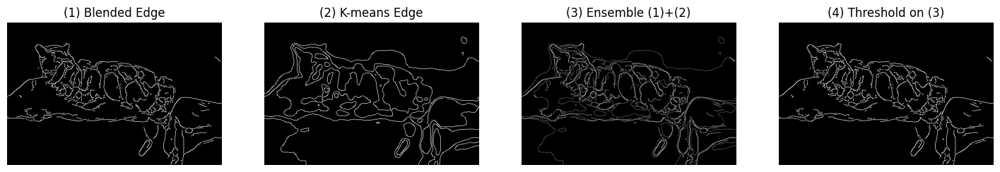

Processing image : train/100080


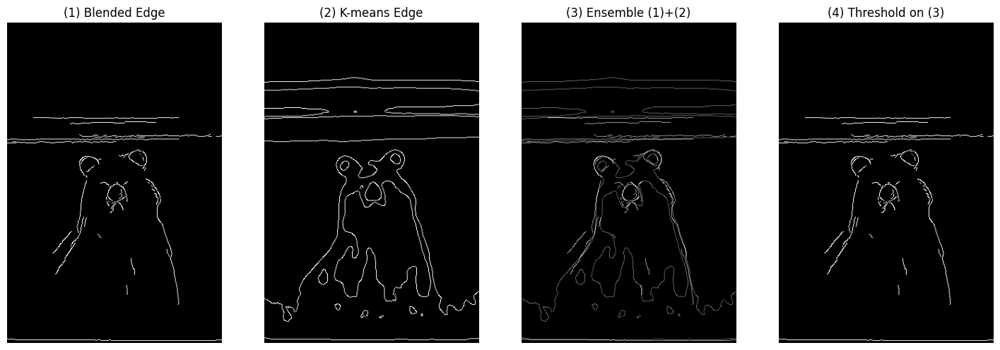

Processing image : train/374020


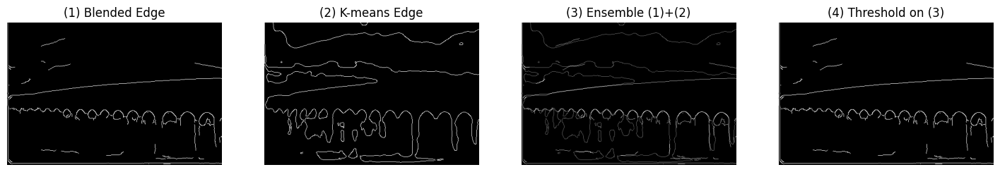

Processing image : train/296059


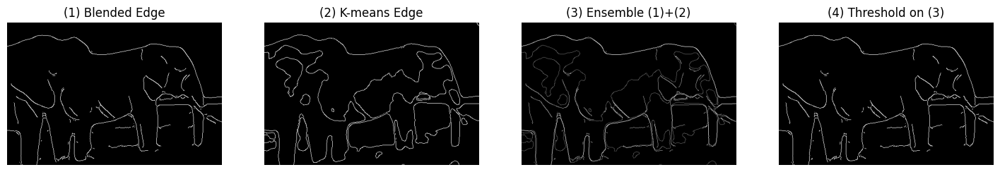

Processing image : train/293029


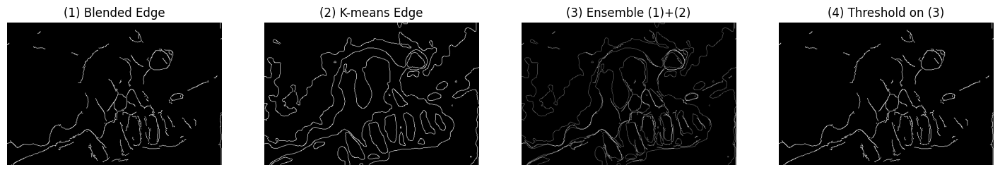

Processing image : train/299091


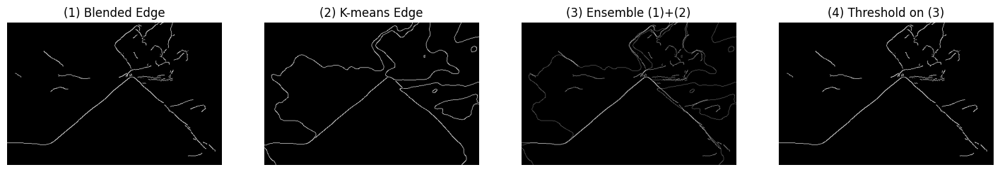

Processing image : train/147021


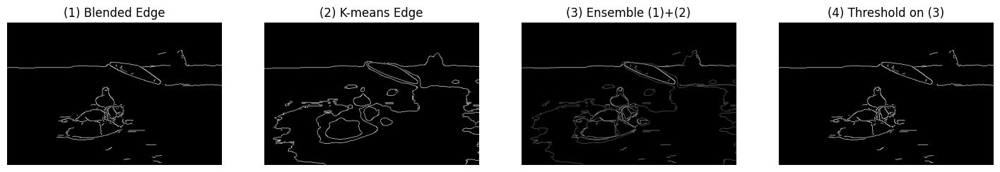

Processing image : train/106020


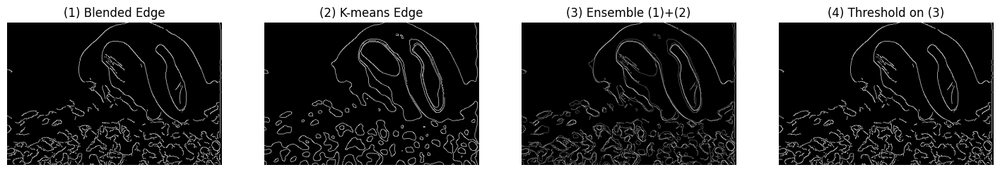

In [14]:
k=4 # Number of clusters in k-means
for selected_sample_name in selected_sample_names:
    print(f"Processing image : {split}/{selected_sample_name}")
    image = dataset.read_image(selected_sample_name)
    image_np = np.array(image)
    image = cv2.cvtColor(image_np, cv2.COLOR_BGR2RGB)
    # Apply blend_33 function on Image
    blended, edge = blend_33(image, 30 ,50)
    pixel_values = preprocess_image(blended)

    # Apply k-means
    compactness, labels, centers = perform_kmeans_clustering(pixel_values, k)
    # Create the segmented image
    segmented_image = create_segmented_image(pixel_values, labels, centers)

    edge2 = cv2.Canny(segmented_image, 50, 100, apertureSize=3)

    # Apply weighted ensemble
    alpha1=0.6
    combined_weighted1 = cv2.addWeighted(edge, alpha1, edge2, 1-alpha1, 0, dst=None, dtype=None)

    # Apply threshold to the image with weighted ensemble applied
    threshold_value = 152.5
    _, strong_edges = cv2.threshold(combined_weighted1, threshold_value, 255, cv2.THRESH_BINARY)

    # Visualize the results
    plt.figure(figsize=(18, 6))
    plt.subplot(1, 4, 1)
    plt.title("(1) Blended Edge")
    plt.imshow(edge, cmap="gray")
    plt.axis("off")

    plt.subplot(1, 4, 2)
    plt.title("(2) K-means Edge")
    plt.imshow(edge2, cmap="gray")
    plt.axis("off")

    plt.subplot(1, 4, 3)
    plt.title("(3) Ensemble (1)+(2)")
    plt.imshow(combined_weighted1, cmap="gray")
    plt.axis("off")

    plt.subplot(1, 4, 4)
    plt.title("(4) Threshold on (3)")
    plt.imshow(strong_edges, cmap="gray")
    plt.axis("off")

    plt.show()

### Create first_try.npy file

In [10]:
k=4 # Number of clusters in k-means

# Dictionary to store the combined_weighted image
combined_weighted_dict = {}
num = 1
for selected_sample_name in dataset.sample_names:
    print(f"Processing image {num} : {split}/{selected_sample_name}")
    image = dataset.read_image(selected_sample_name)
    image_np = np.array(image)
    image = cv2.cvtColor(image_np, cv2.COLOR_BGR2RGB)
    # Apply blend_33 function on Image
    blended, edge = blend_33(image, 30, 50)
    pixel_values = preprocess_image(blended)

    # Apply k-means
    compactness, labels, centers = perform_kmeans_clustering(pixel_values, k)
    # Create the segmented image
    segmented_image = create_segmented_image(pixel_values, labels, centers)
    edge2 = cv2.Canny(segmented_image, 50, 100, apertureSize=3)

    # Apply weighted ensemble
    alpha1=0.6
    combined_weighted1 = cv2.addWeighted(edge, alpha1, edge2, 1-alpha1, 0, dst=None, dtype=None)

    # Apply threshold to the image with weighted ensemble applied
    threshold_value = 152.5
    _, strong_edges = cv2.threshold(combined_weighted1, threshold_value, 255, cv2.THRESH_BINARY)

    # Save to dictionary
    combined_weighted_dict[selected_sample_name] = strong_edges
    num += 1

# Save the dictionary as a .npy file
output_path = f"/content/gdrive/MyDrive/CV/Group_Project/npy_files/{split}_first_try.npy"
np.save(output_path, combined_weighted_dict)
print(f"Combined weighted images saved to {output_path}")

Processing image 1 : train/108070
Processing image 2 : train/33039
Processing image 3 : train/310007
Processing image 4 : train/28096
Processing image 5 : train/239007
Processing image 6 : train/242078
Processing image 7 : train/113016
Processing image 8 : train/178054
Processing image 9 : train/227040
Processing image 10 : train/198054
Processing image 11 : train/23084
Processing image 12 : train/118035
Processing image 13 : train/42049
Processing image 14 : train/118020
Processing image 15 : train/271031
Processing image 16 : train/157055
Processing image 17 : train/159008
Processing image 18 : train/385028
Processing image 19 : train/187029
Processing image 20 : train/376020
Processing image 21 : train/48055
Processing image 22 : train/45096
Processing image 23 : train/135069
Processing image 24 : train/368078
Processing image 25 : train/103041
Processing image 26 : train/216081
Processing image 27 : train/46076
Processing image 28 : train/130026
Processing image 29 : train/104022
P

# Second Try (Report 4.2)

### Visualize the Second Try Image

Processing image : train/183055


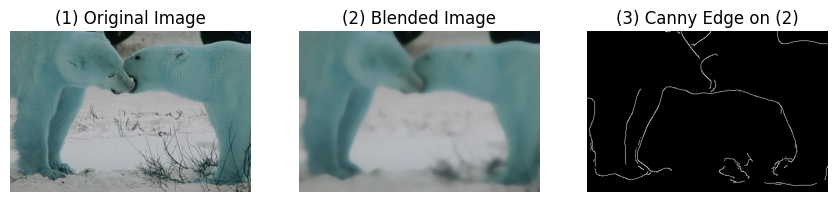

Processing image : train/89072


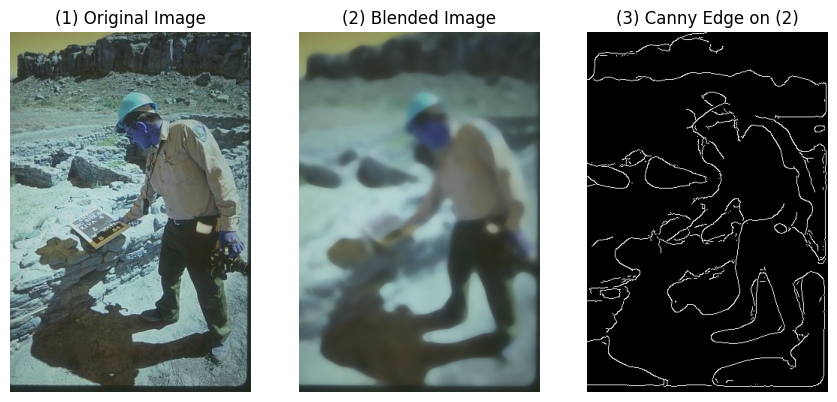

Processing image : train/160068


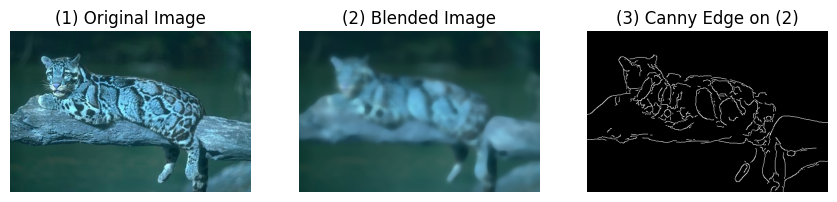

Processing image : train/100080


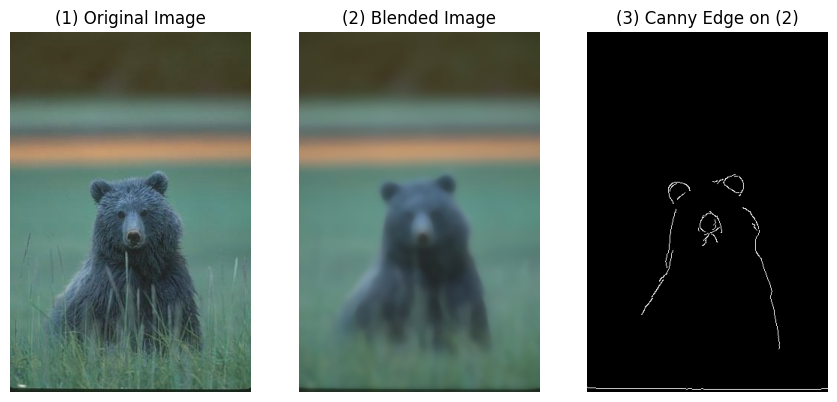

Processing image : train/374020


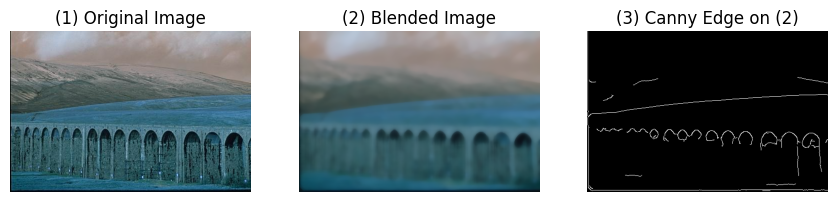

Processing image : train/296059


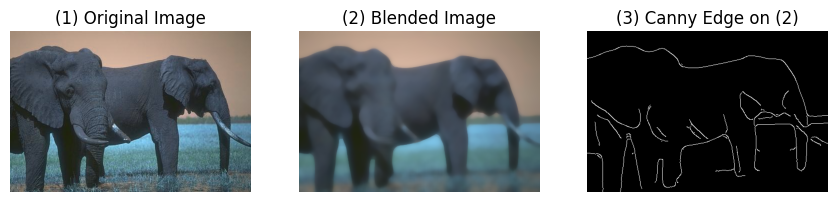

Processing image : train/293029


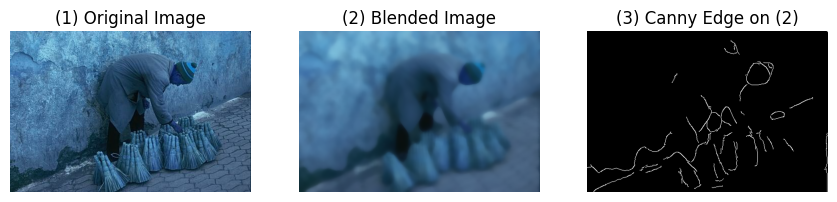

Processing image : train/299091


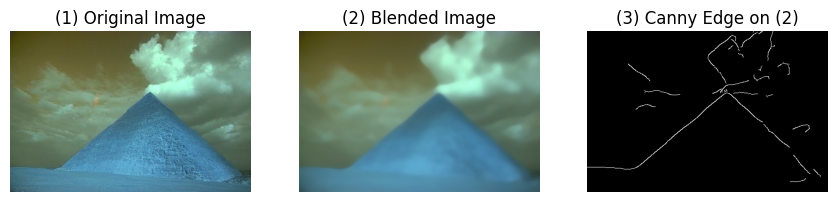

Processing image : train/147021


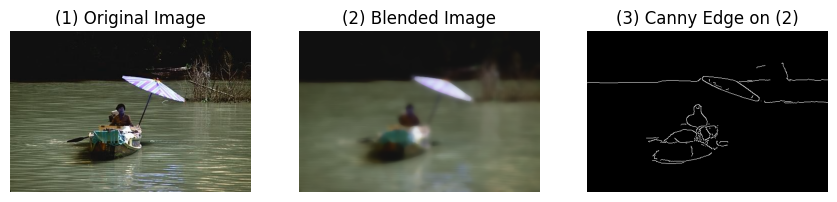

Processing image : train/106020


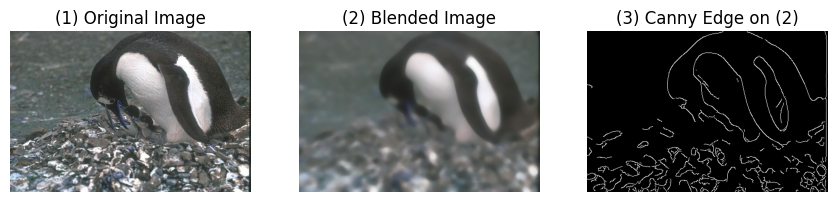

In [18]:
for selected_sample_name in selected_sample_names :
    print(f"Processing image : {split}/{selected_sample_name}")
    image = dataset.read_image(selected_sample_name)
    image_np = np.array(image)
    image = cv2.cvtColor(image_np, cv2.COLOR_BGR2RGB)
    # Apply the blend_33 function to the image with different Threshold
    blended, edge = blend_33(image, 30, 65)

    # Visualize the results
    plt.figure(figsize=(18, 6))
    plt.subplot(1, 5, 1)
    plt.title("(1) Original Image")
    plt.imshow(image, cmap="gray")
    plt.axis("off")

    plt.subplot(1, 5, 2)
    plt.title("(2) Blended Image")
    plt.imshow(blended, cmap="gray")
    plt.axis("off")

    plt.subplot(1, 5, 3)
    plt.title("(3) Canny Edge on (2)")
    plt.imshow(edge, cmap="gray")
    plt.axis("off")

    plt.show()

### Create second_try.npy file

In [12]:
# Dictionary to store the combined_weighted image
combined_weighted_dict = {}
num = 1
for selected_sample_name in dataset.sample_names:
    print(f"Processing image {num} : {split}/{selected_sample_name}")
    image = dataset.read_image(selected_sample_name)
    image_np = np.array(image)
    image = cv2.cvtColor(image_np, cv2.COLOR_BGR2RGB)
    # Apply the blend_33 function to the image with different Threshold
    blended, edge = blend_33(image, 30, 65)

    # Save to dictionary
    combined_weighted_dict[selected_sample_name] = edge
    num += 1

# Save the dictionary as a .npy file
output_path = f"/content/gdrive/MyDrive/CV/Group_Project/npy_files/{split}_second_try.npy"
np.save(output_path, combined_weighted_dict)
print(f"Combined weighted images saved to {output_path}")

Processing image 1 : train/108070
Processing image 2 : train/33039
Processing image 3 : train/310007
Processing image 4 : train/28096
Processing image 5 : train/239007
Processing image 6 : train/242078
Processing image 7 : train/113016
Processing image 8 : train/178054
Processing image 9 : train/227040
Processing image 10 : train/198054
Processing image 11 : train/23084
Processing image 12 : train/118035
Processing image 13 : train/42049
Processing image 14 : train/118020
Processing image 15 : train/271031
Processing image 16 : train/157055
Processing image 17 : train/159008
Processing image 18 : train/385028
Processing image 19 : train/187029
Processing image 20 : train/376020
Processing image 21 : train/48055
Processing image 22 : train/45096
Processing image 23 : train/135069
Processing image 24 : train/368078
Processing image 25 : train/103041
Processing image 26 : train/216081
Processing image 27 : train/46076
Processing image 28 : train/130026
Processing image 29 : train/104022
P

# Final (Report 4.3)

### blend_3.2 Function (Report 3.2)

In [9]:
def blend_32(image, threshold1, threshold2) :
  # Generate a pair of Gaussian and Median blurred images
  gblur_img  = cv2.GaussianBlur(image, (11, 11), sigmaX = 0, sigmaY = 0)
  mblur_img  = cv2.medianBlur(image, ksize=17)

  # Apply weighted ensemble to the Gaussian-Median pair
  alpha = 0.45
  blended = cv2.addWeighted(gblur_img, 1-alpha, mblur_img, alpha, 0)

  # Apply Canny Edge Detection
  edge = cv2.Canny(blended, threshold1, threshold2)

  return blended, edge

### Visualize the Final Image

Processing image : train/183055


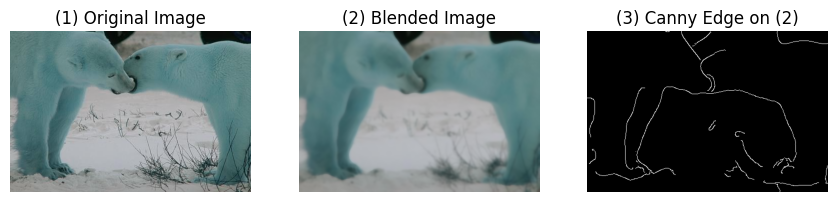

Processing image : train/89072


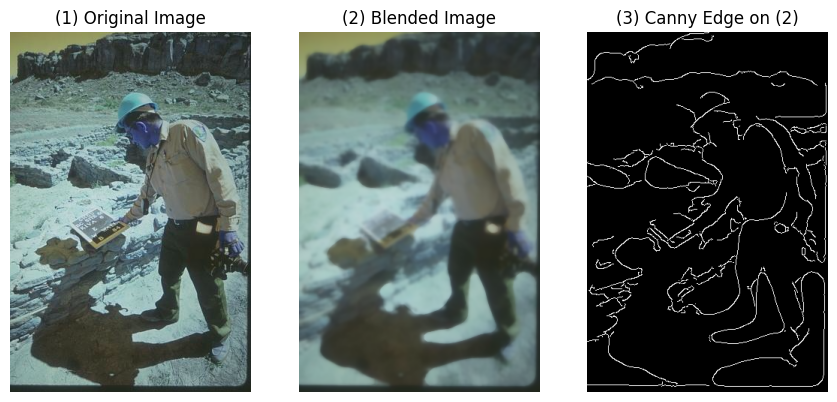

Processing image : train/160068


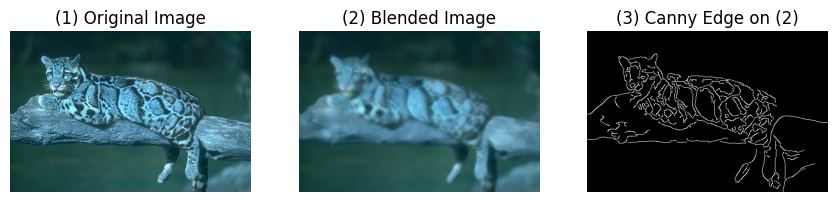

Processing image : train/100080


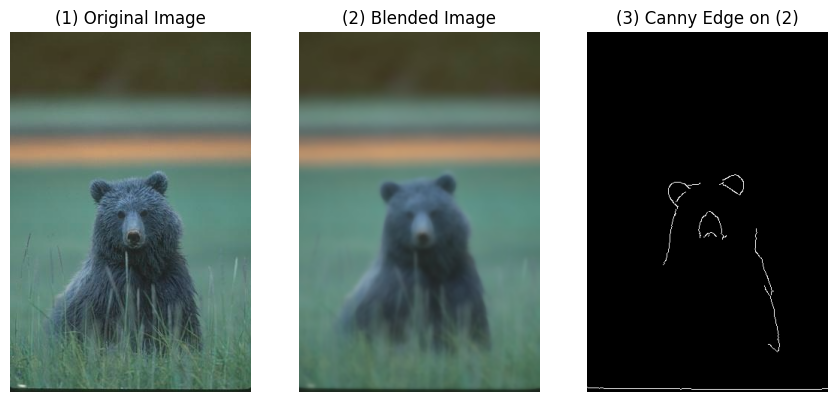

Processing image : train/374020


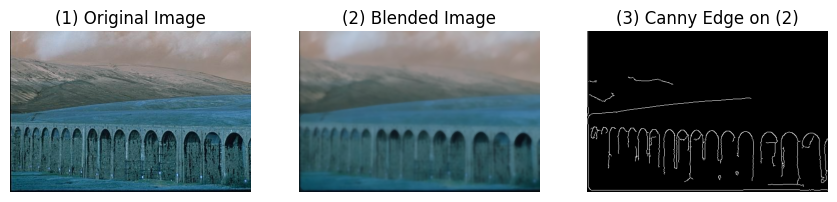

Processing image : train/296059


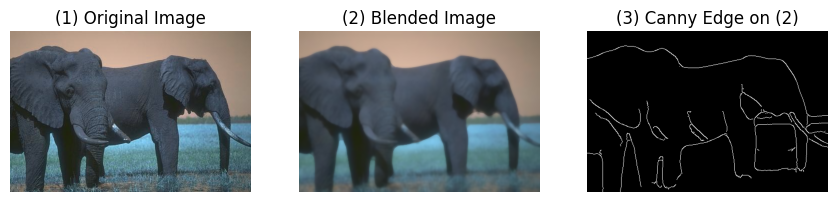

Processing image : train/293029


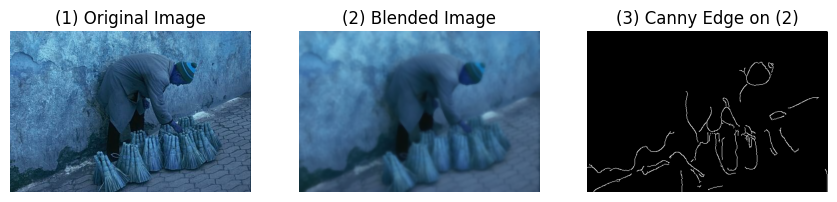

Processing image : train/299091


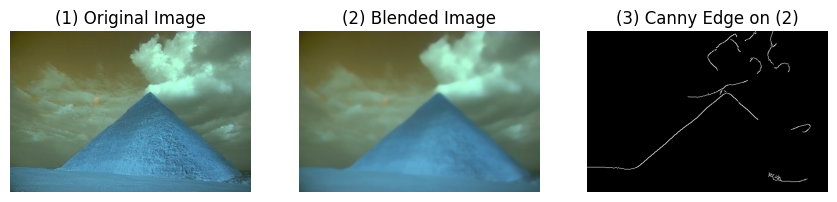

Processing image : train/147021


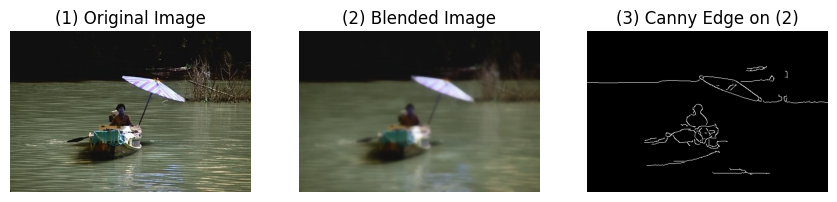

Processing image : train/106020


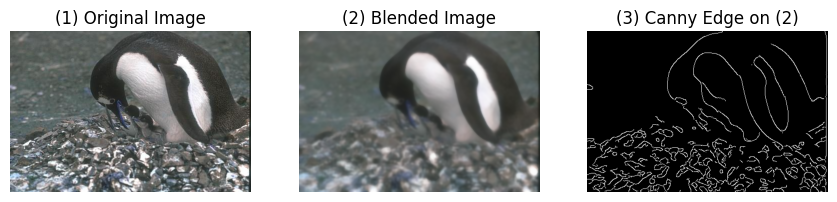

In [17]:
for selected_sample_name in selected_sample_names :
    print(f"Processing image : {split}/{selected_sample_name}")
    image = dataset.read_image(selected_sample_name)
    image_np = np.array(image)
    image = cv2.cvtColor(image_np, cv2.COLOR_BGR2RGB)
    # Apply the blend_32 function to the image
    blended, edge = blend_32(image, 5, 95)

    # Visualize the results
    plt.figure(figsize=(18, 6))
    plt.subplot(1, 5, 1)
    plt.title("(1) Original Image")
    plt.imshow(image, cmap="gray")
    plt.axis("off")

    plt.subplot(1, 5, 2)
    plt.title("(2) Blended Image")
    plt.imshow(blended, cmap="gray")
    plt.axis("off")

    plt.subplot(1, 5, 3)
    plt.title("(3) Canny Edge on (2)")
    plt.imshow(edge, cmap="gray")
    plt.axis("off")

    plt.show()

### Create final.npy file

In [15]:
# Dictionary to store the combined_weighted image
combined_weighted_dict = {}
num = 1
for selected_sample_name in dataset.sample_names:
    print(f"Processing image {num} : {split}/{selected_sample_name}")
    image = dataset.read_image(selected_sample_name)
    image_np = np.array(image)
    image = cv2.cvtColor(image_np, cv2.COLOR_BGR2RGB)
    # Apply the blend_32 function to the image
    blended, edge = blend_32(image, 5, 95)

    # Save to dictionary
    combined_weighted_dict[selected_sample_name] = edge
    num += 1

# Save the dictionary as a .npy file
#Train
output_path = f"/content/gdrive/MyDrive/CV/Group_Project/npy_files/{split}_final.npy"

#Test
#output_path = f"/content/gdrive/MyDrive/CV/Group_Project/npy_files/predictions.npy"

np.save(output_path, combined_weighted_dict)
print(f"Combined weighted images saved to {output_path}")

Processing image 1 : train/108070
Processing image 2 : train/33039
Processing image 3 : train/310007
Processing image 4 : train/28096
Processing image 5 : train/239007
Processing image 6 : train/242078
Processing image 7 : train/113016
Processing image 8 : train/178054
Processing image 9 : train/227040
Processing image 10 : train/198054
Processing image 11 : train/23084
Processing image 12 : train/118035
Processing image 13 : train/42049
Processing image 14 : train/118020
Processing image 15 : train/271031
Processing image 16 : train/157055
Processing image 17 : train/159008
Processing image 18 : train/385028
Processing image 19 : train/187029
Processing image 20 : train/376020
Processing image 21 : train/48055
Processing image 22 : train/45096
Processing image 23 : train/135069
Processing image 24 : train/368078
Processing image 25 : train/103041
Processing image 26 : train/216081
Processing image 27 : train/46076
Processing image 28 : train/130026
Processing image 29 : train/104022
P

# Visualie First, Second, and Final results together

Processing image : train/183055


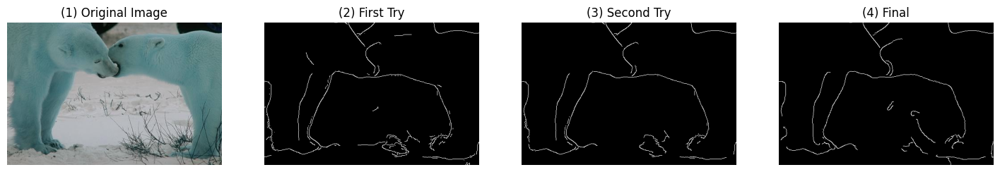

Processing image : train/89072


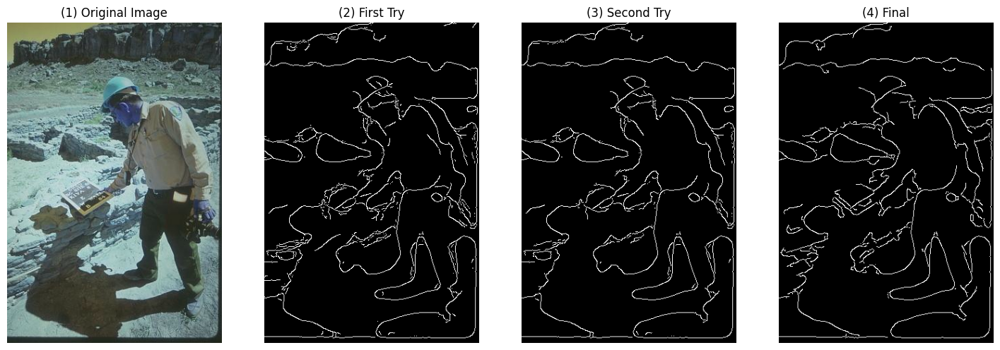

Processing image : train/160068


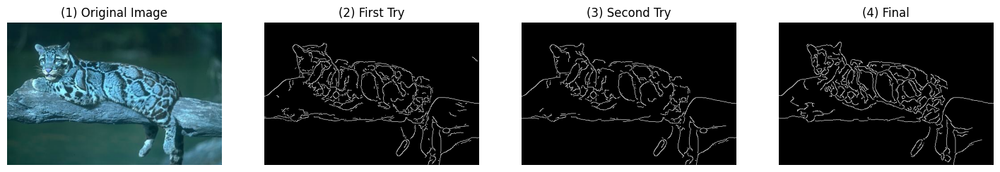

Processing image : train/100080


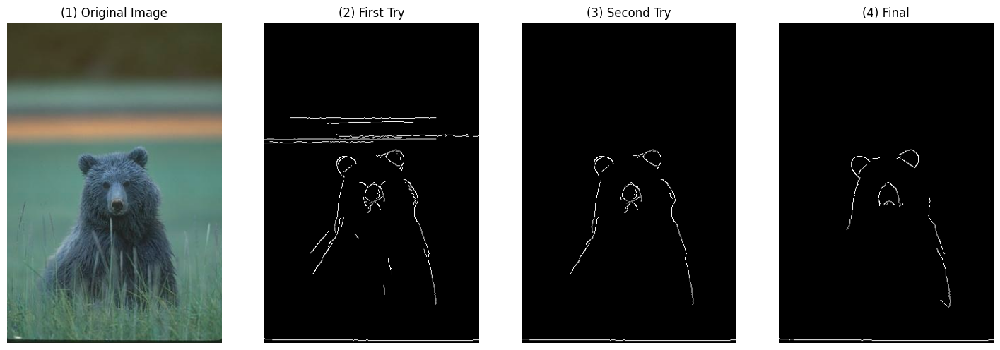

Processing image : train/374020


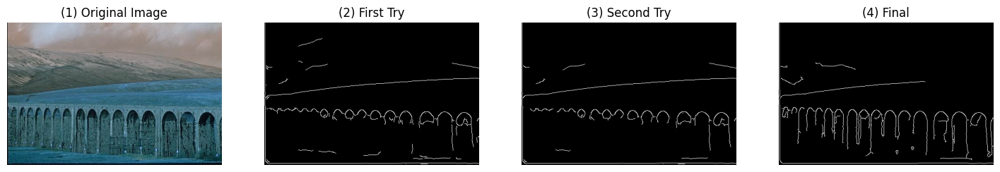

Processing image : train/296059


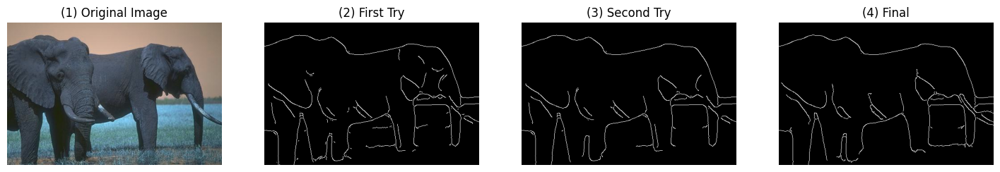

Processing image : train/293029


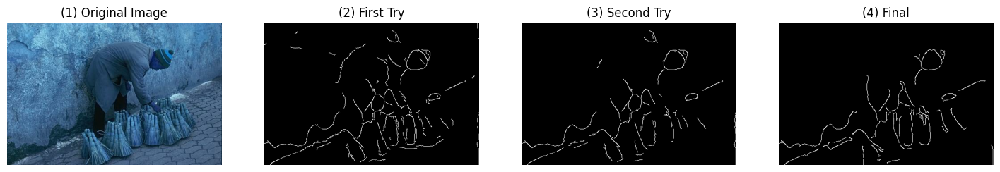

Processing image : train/299091


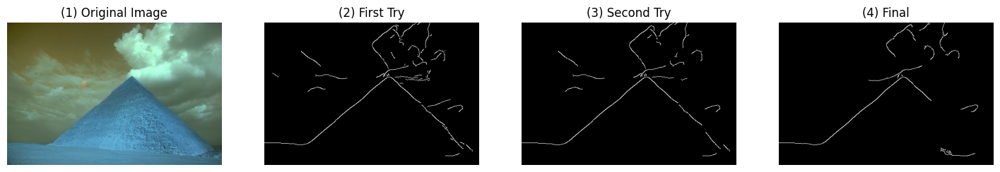

Processing image : train/147021


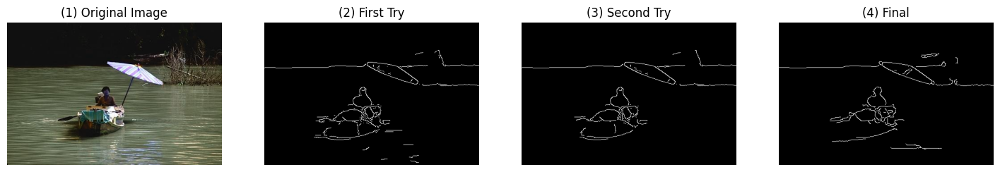

Processing image : train/106020


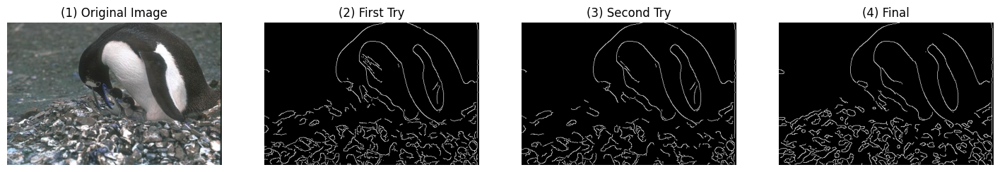

In [16]:
k=4 # Number of clusters in k-means
for selected_sample_name in selected_sample_names:
    print(f"Processing image : {split}/{selected_sample_name}")
    image = dataset.read_image(selected_sample_name)
    image_np = np.array(image)
    image = cv2.cvtColor(image_np, cv2.COLOR_BGR2RGB)

    ##############First Try##############
    # Apply blend_33 function on Image
    blended, edge = blend_33(image, 30 ,50)
    pixel_values = preprocess_image(blended)

    # Apply k-means
    compactness, labels, centers = perform_kmeans_clustering(pixel_values, k)
    # Create the segmented image
    segmented_image = create_segmented_image(pixel_values, labels, centers)
    edge2 = cv2.Canny(segmented_image, 50, 100, apertureSize=3)

    # Apply weighted ensemble
    alpha1=0.6
    combined_weighted1 = cv2.addWeighted(edge, alpha1, edge2, 1-alpha1, 0, dst=None, dtype=None)

    # Apply threshold to the image with weighted ensemble applied
    threshold_value = 152.5
    _, strong_edges = cv2.threshold(combined_weighted1, threshold_value, 255, cv2.THRESH_BINARY)

    ##############Second Try##############
    # Apply the blend_33 function to the image with different Threshold
    blended_second, edge_second = blend_33(image, 30, 65)

    ###############Final###############
    # Apply the blend_32 function to the image
    blended_final, edge_final = blend_32(image, 5, 95)

    # Visualize the results
    plt.figure(figsize=(18, 6))
    plt.subplot(1, 4, 1)
    plt.title("(1) Original Image")
    plt.imshow(image, cmap="gray")
    plt.axis("off")

    plt.subplot(1, 4, 2)
    plt.title("(2) First Try")
    plt.imshow(strong_edges, cmap="gray")
    plt.axis("off")

    plt.subplot(1, 4, 3)
    plt.title("(3) Second Try")
    plt.imshow(edge_second, cmap="gray")
    plt.axis("off")

    plt.subplot(1, 4, 4)
    plt.title("(4) Final")
    plt.imshow(edge_final, cmap="gray")
    plt.axis("off")

    plt.show()